In [6]:
import pickle
import numpy as np
# Path to the pickle file
pkl_path = '/kaggle/input/eeg-data/combined_eeg_adjusted (1).pkl'

# Load the pickle file
with open(pkl_path, 'rb') as f:
    data = pickle.load(f)


# Separate signals and labels
signals_eeg = np.array([entry['signal'] for entry in data])
labels_eeg = np.array([entry['label'] for entry in data])

# Display the arrays
print("Signals array shape:", signals_eeg.shape)
print("Labels array:", labels_eeg.shape)

Signals array shape: (1222, 48, 2048)
Labels array: (1222,)


In [7]:
label_order = ['three', 'four', 'six', 'ten', 'child', 'daughter', 'wife','father']
number_labels = {'three', 'four', 'six', 'ten'}  # These labels belong to class 0
social_labels = {'child', 'daughter', 'wife', 'father'}  # These labels belong to class 1

# Map labels to 0 or 1
binary_labels = np.array([0 if label in number_labels else 1 for label in labels_eeg])
print(binary_labels)

[0 0 0 ... 0 1 1]


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 16s 313ms/step - accuracy: 0.4849 - loss: 8.8381 - val_accuracy: 0.5184 - val_loss: 0.8519
Epoch 2/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.5530 - loss: 0.7033 - val_accuracy: 0.5102 - val_loss: 7.3909
Epoch 3/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.5497 - loss: 0.6615 - val_accuracy: 0.4939 - val_loss: 8.5117
Epoch 4/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.5318 - loss: 0.6532 - val_accuracy: 0.5224 - val_loss: 10.9340
Epoch 5/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.5577 - loss: 0.6287 - val_accuracy: 0.5306 - val_loss: 12.9094
Epoch 6/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.5975 - loss: 0.6392 - val_accuracy: 0.5265 - val_loss: 14.2285
Epoch 7/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.6200 - loss: 0.5690 - val_accuracy: 0.5143 - val_loss: 16.2250
Epoch 8/20
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.6119 - loss: 0.5834 - val_accuracy: 0.51

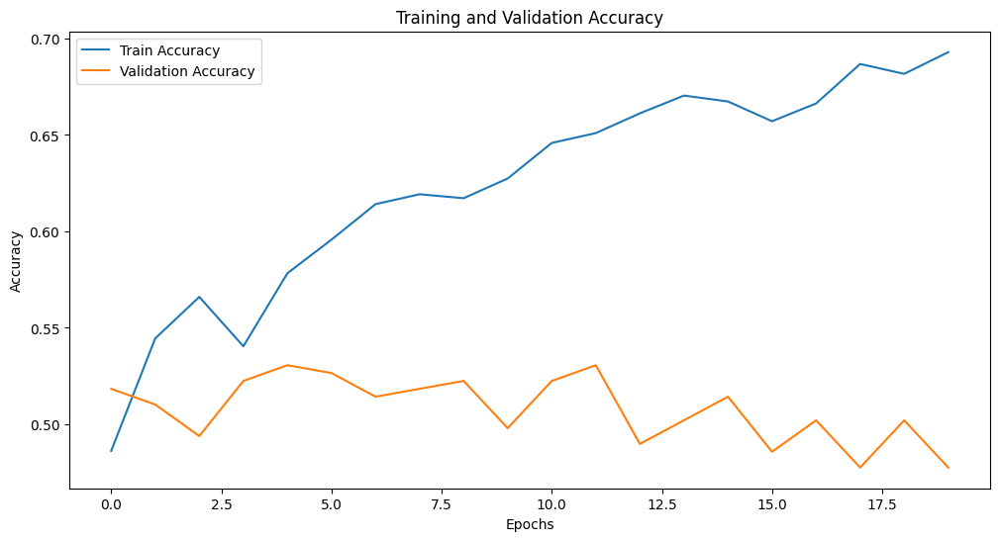

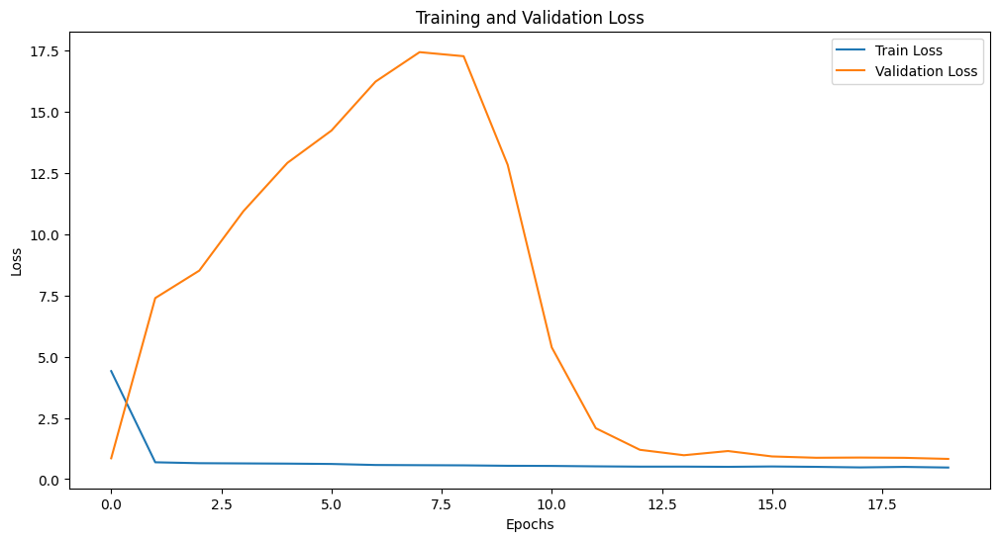

In [8]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np



filtered_signals = signals_eeg

# Normalize the signals
scaler = StandardScaler()
normalized_signals = np.array([
    scaler.fit_transform(trial.T).T for trial in filtered_signals  # Normalize per channel
])

# Expand dimensions for CNN input
cnn_input = np.expand_dims(normalized_signals, axis=-1)  # Shape: (samples, channels, timepoints, 1)

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    cnn_input, binary_labels, test_size=0.2, random_state=42, stratify=binary_labels
)

# Convert labels to one-hot encoding
y_train = tf.keras.utils.to_categorical(y_train, num_classes=2)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=2)

# Define the CNN model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2], 1)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.5),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')  # Output layer for binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=20,
    batch_size=32,
    verbose=1
)

# Evaluate the model
eval_results = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {eval_results[0]:.4f}")
print(f"Test Accuracy: {eval_results[1]:.4f}")

# Plot training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()


Epoch 1/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 14s 281ms/step - accuracy: 0.5007 - loss: 30.4833 - val_accuracy: 0.4898 - val_loss: 0.7120
Epoch 2/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - accuracy: 0.5101 - loss: 0.9713 - val_accuracy: 0.4980 - val_loss: 27.2392
Epoch 3/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - accuracy: 0.5522 - loss: 0.6980 - val_accuracy: 0.4939 - val_loss: 107.4620
Epoch 4/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - accuracy: 0.5632 - loss: 0.7489 - val_accuracy: 0.4939 - val_loss: 133.5545
Epoch 5/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - accuracy: 0.5550 - loss: 0.6782 - val_accuracy: 0.4939 - val_loss: 134.9021
Epoch 6/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.5511 - loss: 0.6594 - val_accuracy: 0.4939 - val_loss: 124.7898
Epoch 7/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.5555 - loss: 0.6436 - val_accuracy: 0.4939 - val_loss: 107.1178
Epoch 8/30
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - accuracy: 0.5628 - loss: 0.6295 - val_accura

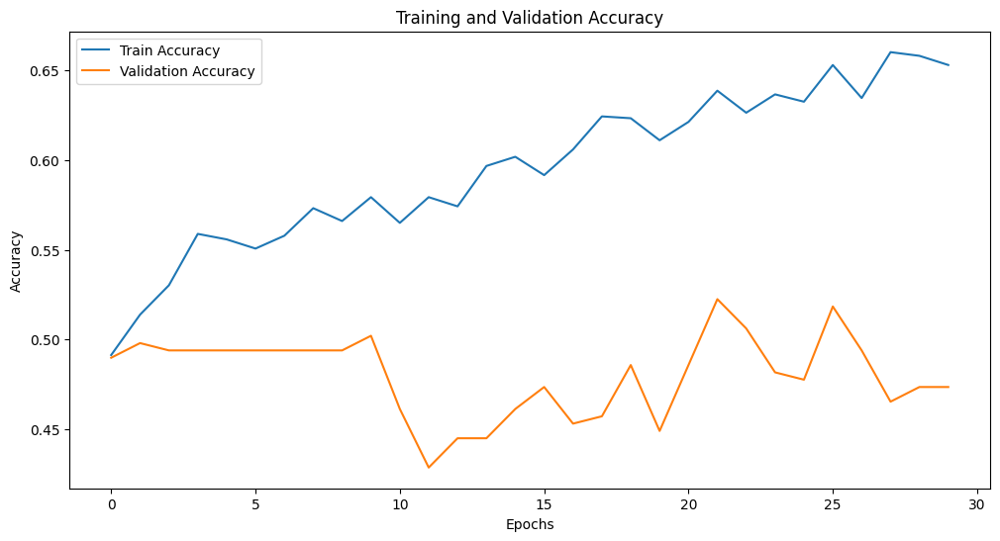

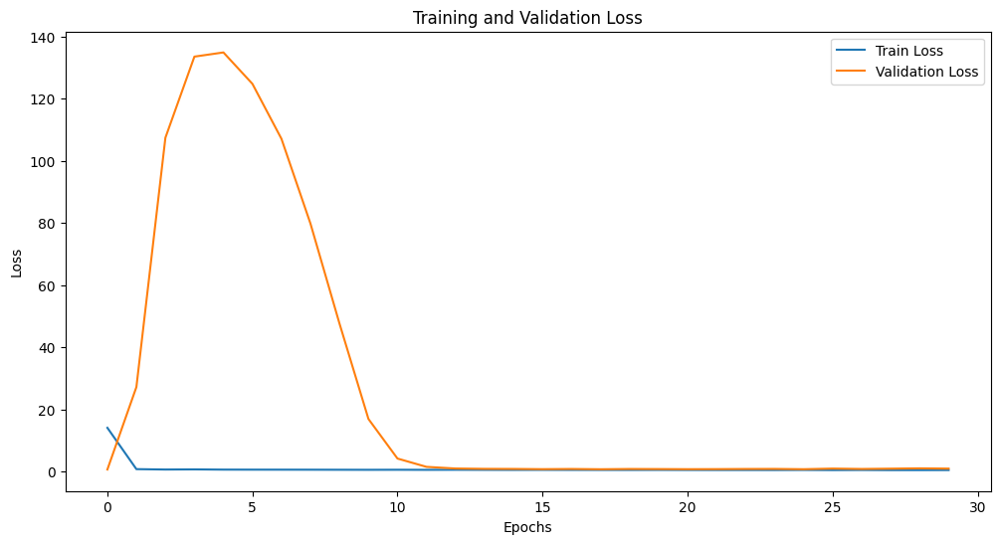

In [10]:
# Define the enhanced CNN model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2], 1)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(2, activation='softmax')
])


# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the enhanced CNN
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=30,  # Increased epochs
    batch_size=32,
    verbose=1
)

# Evaluate the model
eval_results = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {eval_results[0]:.4f}")
print(f"Test Accuracy: {eval_results[1]:.4f}")

# Plot training history
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()


In [ ]:
# Ensure input and labels are aligned
cnn_input_processed = preprocess_data(cnn_input[:len(binary_labels)])  # Trim input to match label size
print(f"Processed Input Shape (aligned): {cnn_input_processed.shape}")
print(f"Labels Shape: {len(binary_labels)}")

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    cnn_input_processed, binary_labels, test_size=0.2, random_state=42, stratify=binary_labels
)

# Convert labels to one-hot encoding
y_train = tf.keras.utils.to_categorical(y_train, num_classes=2)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=2)

# Define and compile the model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
base_model.trainable = False

model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(2, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=20,
    batch_size=32
)

# Evaluate the model
eval_results = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {eval_results[0]:.4f}")
print(f"Test Accuracy: {eval_results[1]:.4f}")


In [13]:
#--------------------------------------------------------------------------------------------------#

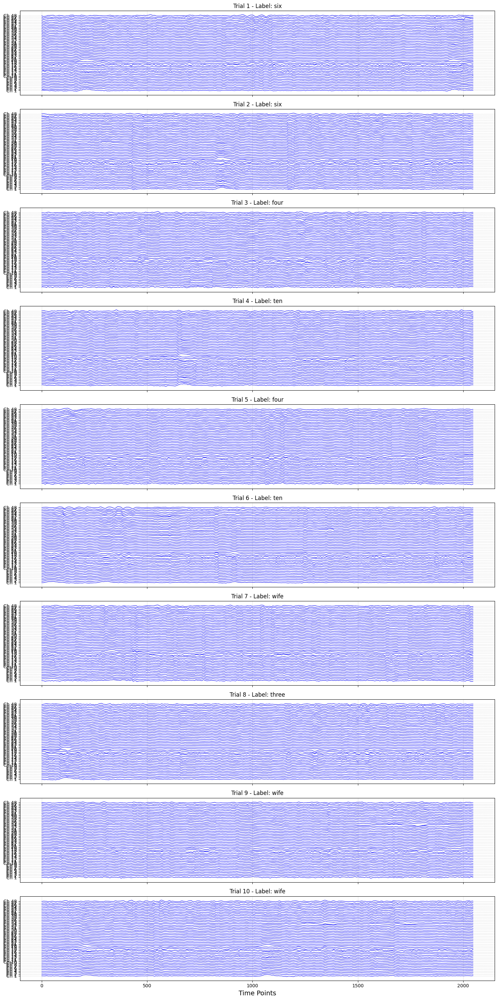

In [42]:
import matplotlib.pyplot as plt
import numpy as np

# Function to visualize multiple trials
def visualize_multiple_trials(signals, labels, num_trials=10):
    trials_to_plot = min(num_trials, len(signals))  # Ensure we don't exceed available trials
    
    fig, axes = plt.subplots(trials_to_plot, 1, figsize=(15, trials_to_plot * 3), sharex=True)
    
    for trial_index in range(trials_to_plot):
        trial_signal = signals[trial_index]  # Select one trial
        label = labels[trial_index]  # Label of the trial

        # Normalize the signals
        normalized_signals = (trial_signal - np.mean(trial_signal, axis=1, keepdims=True)) / np.std(trial_signal, axis=1, keepdims=True)

        # Set vertical spacing for stacking
        spacing = 5
        for i in range(normalized_signals.shape[0]):  # Loop through all channels
            axes[trial_index].plot(normalized_signals[i] + i * spacing, color='blue', linewidth=0.8)
        
        # Add title with the label for each trial
        axes[trial_index].set_title(f"Trial {trial_index + 1} - Label: {label}", fontsize=12)
        axes[trial_index].set_yticks([i * spacing for i in range(normalized_signals.shape[0])])
        axes[trial_index].set_yticklabels([f"Ch {i + 1}" for i in range(normalized_signals.shape[0])])
        axes[trial_index].grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    # Common x-label for time points
    plt.xlabel("Time Points", fontsize=14)
    plt.tight_layout()
    plt.show()

# Visualize 10 trials
visualize_multiple_trials(signals_eeg, labels_eeg, num_trials=10)


In [43]:
import numpy as np

def normalize_eeg(data):
    """
    Normalize EEG data using z-score normalization.

    Args:
    - data (numpy array): EEG signals with shape (trials, channels, timepoints).

    Returns:
    - normalized_data (numpy array): Normalized EEG signals.
    """
    normalized_data = np.empty_like(data)
    for i in range(data.shape[0]):  # Iterate over trials
        for j in range(data.shape[1]):  # Iterate over channels
            channel = data[i, j, :]
            normalized_data[i, j, :] = (channel - np.mean(channel)) / (np.std(channel) + 1e-6)
    return normalized_data

# Apply normalization
normalized_signals_eeg = normalize_eeg(signals_eeg)

# Verify
print("Original Signals Shape:", signals_eeg.shape)
print("Normalized Signals Shape:", normalized_signals_eeg.shape)


Original Signals Shape: (10, 48, 2048)
Normalized Signals Shape: (10, 48, 2048)


In [44]:
from scipy.linalg import svd

def apply_ssa(signal, window_length=100):
    """
    Apply Singular Spectrum Analysis (SSA) to decompose the signal.
    
    Args:
    - signal (numpy array): 1D EEG signal (timepoints).
    - window_length (int): Window length for trajectory matrix.
    
    Returns:
    - reconstructed_signal (numpy array): Sum of first 3 components.
    """
    n = len(signal)
    k = n - window_length + 1

    # Step 1: Construct trajectory matrix
    trajectory_matrix = np.array([signal[i:i + window_length] for i in range(k)])

    # Step 2: Perform Singular Value Decomposition (SVD)
    U, s, Vt = svd(trajectory_matrix, full_matrices=False)

    # Step 3: Reconstruct components
    components = [s[i] * np.outer(U[:, i], Vt[i, :]) for i in range(len(s))]
    
    # Return sum of first 3 components
    reconstructed_signal = np.sum(components[:3], axis=0).flatten()
    return reconstructed_signal

def ssa_transform(data, window_length=100):
    """
    Apply SSA to all trials and channels.
    
    Args:
    - data (numpy array): EEG signals with shape (trials, channels, timepoints).
    - window_length (int): Window length for SSA.
    
    Returns:
    - ssa_data (numpy array): SSA-transformed signals.
    """
    ssa_data = []
    for trial in data:
        trial_components = []
        for channel in trial:
            reconstructed_signal = apply_ssa(channel, window_length)
            trial_components.append(reconstructed_signal)
        ssa_data.append(np.array(trial_components))
    return np.array(ssa_data)

# Apply SSA
ssa_signals = ssa_transform(normalized_signals_eeg, window_length=100)
print("SSA Signals Shape:", ssa_signals.shape)


SSA Signals Shape: (10, 48, 194900)


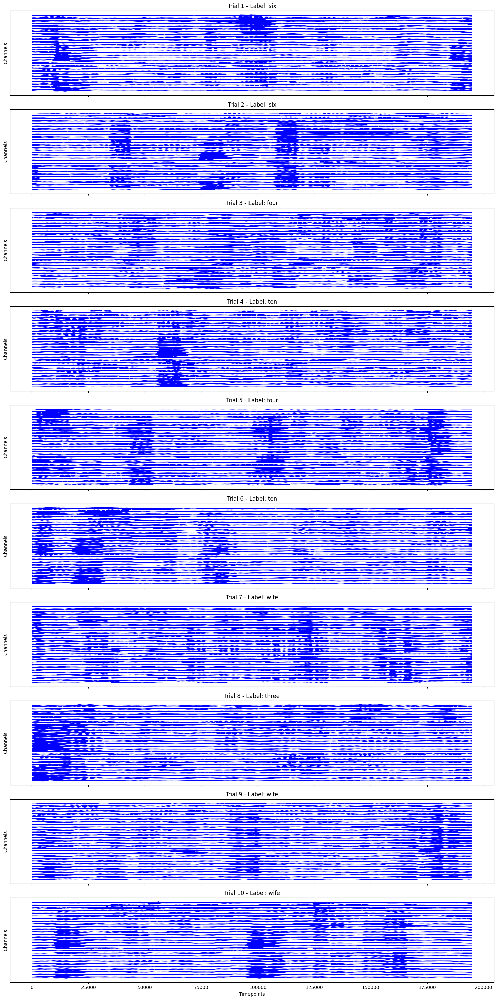

In [45]:
import matplotlib.pyplot as plt

def visualize_trials(data, labels, num_trials=10):
    """
    Visualize EEG signals for multiple trials.
    
    Args:
    - data (numpy array): EEG signals with shape (trials, channels, timepoints).
    - labels (list): Labels corresponding to each trial.
    - num_trials (int): Number of trials to visualize.
    """
    fig, axes = plt.subplots(num_trials, 1, figsize=(15, num_trials * 3), sharex=True)
    for i in range(num_trials):
        trial_data = data[i]
        label = labels[i]
        
        # Stack all channels vertically for this trial
        stacked_data = np.vstack(trial_data)
        offset = np.arange(stacked_data.shape[0])[:, None] * 5  # Add offsets for visualization
        stacked_data += offset
        
        # Plot the trial
        axes[i].plot(stacked_data.T, color='blue', linewidth=0.5)
        axes[i].set_title(f"Trial {i + 1} - Label: {label}")
        axes[i].set_yticks([])
        axes[i].set_ylabel("Channels")
    
    plt.xlabel("Timepoints")
    plt.tight_layout()
    plt.show()

# Visualize first 10 trials
visualize_trials(ssa_signals, labels_eeg, num_trials=10)


In [46]:
!pip install pyts


[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [47]:
from pyts.image import GramianAngularField

def compute_gasf(data):
    """
    Compute Gramian Angular Field (GASF) for EEG data.

    Args:
    - data (numpy array): EEG signals with shape (trials, channels, timepoints).

    Returns:
    - gasf_images (numpy array): GASF-transformed signals.
    """
    gasf = GramianAngularField(image_size=data.shape[2])
    gasf_images = []
    for trial in data:
        trial_images = []
        for channel in trial:
            gasf_image = gasf.fit_transform(channel.reshape(1, -1))[0]
            trial_images.append(gasf_image)
        gasf_images.append(np.array(trial_images))
    return np.array(gasf_images)

# Apply GASF Transformation
gasf_images = compute_gasf(normalized_signals_eeg)
print("GASF Images Shape:", gasf_images.shape)  # Shape: (trials, channels, image_size, image_size)


GASF Images Shape: (10, 48, 2048, 2048)


In [48]:
from tqdm import tqdm
def compute_mtf(signal, num_states=10):
    """
    Compute Markov Transition Field (MTF) for a 1D signal.

    Args:
    - signal (numpy array): 1D EEG signal (timepoints).
    - num_states (int): Number of quantization levels.

    Returns:
    - mtf_image (numpy array): MTF-transformed signal.
    """
    quantized = np.digitize(signal, bins=np.linspace(np.min(signal), np.max(signal), num_states))
    n_states = np.max(quantized)
    idx = quantized[:-1] - 1
    next_idx = quantized[1:] - 1
    transition_matrix = np.zeros((n_states, n_states), dtype=np.float32)
    np.add.at(transition_matrix, (idx, next_idx), 1)
    transition_matrix /= (transition_matrix.sum(axis=1, keepdims=True) + 1e-6)
    quantized -= 1
    mtf_image = transition_matrix[quantized][:, quantized]
    return mtf_image

def compute_mtf_images(data):
    """
    Compute MTF for all EEG trials and channels.

    Args:
    - data (numpy array): EEG signals with shape (trials, channels, timepoints).

    Returns:
    - mtf_images (numpy array): MTF-transformed signals.
    """
    mtf_images = []
    for trial in tqdm(data, desc="Processing MTF Images"):
        trial_images = [compute_mtf(channel) for channel in trial]
        mtf_images.append(np.array(trial_images))
    return np.array(mtf_images)

# Apply MTF Transformation
mtf_images = compute_mtf_images(normalized_signals_eeg)
print("MTF Images Shape:", mtf_images.shape)  # Shape: (trials, channels, timepoints, timepoints)


Processing MTF Images: 100%|██████████| 10/10 [00:14<00:00,  1.45s/it]


MTF Images Shape: (10, 48, 2048, 2048)


In [49]:
from scipy.signal import stft
import numpy as np

def compute_stft(data, fs=256, nperseg=256):
    """
    Compute Short-Time Fourier Transform (STFT) for EEG data.

    Args:
    - data (numpy array): EEG signals with shape (trials, channels, timepoints).
    - fs (int): Sampling frequency.
    - nperseg (int): Length of each segment for STFT.

    Returns:
    - stft_data (numpy array): STFT-transformed data.
    """
    stft_data = []
    for trial in data:
        trial_stft = []
        for channel in trial:
            _, _, Zxx = stft(channel, fs=fs, nperseg=nperseg)
            trial_stft.append(np.abs(Zxx))  # Take magnitude of the STFT
        stft_data.append(np.array(trial_stft))
    return np.array(stft_data)


stft_signals = compute_stft(normalized_signals_eeg)
print("STFT Signals Shape:", stft_signals.shape) 

STFT Signals Shape: (10, 48, 129, 17)


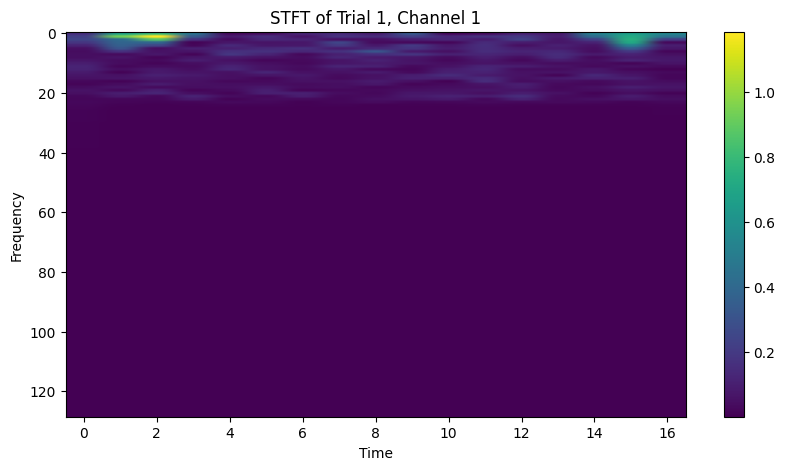

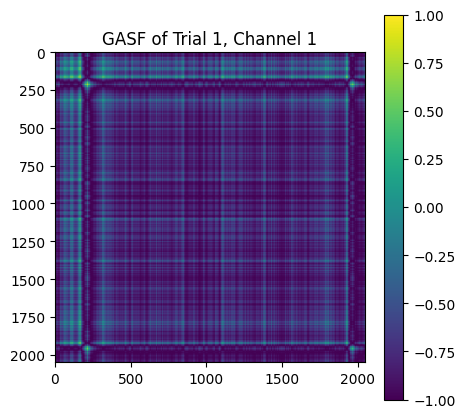

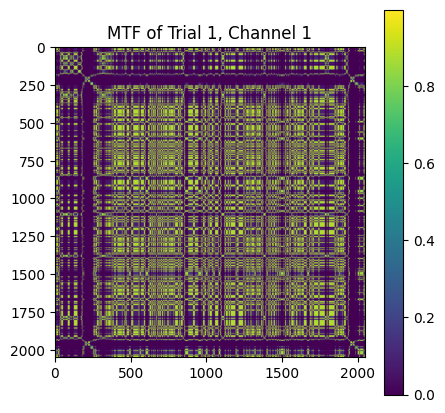

In [50]:
# Visualization of STFT
trial_idx = 0
channel_idx = 0
plt.figure(figsize=(10, 5))
plt.imshow(stft_signals[trial_idx, channel_idx], aspect='auto', cmap='viridis')
plt.colorbar()
plt.title(f"STFT of Trial {trial_idx+1}, Channel {channel_idx+1}")
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.show()

# Visualization of GASF
plt.figure(figsize=(5, 5))
plt.imshow(gasf_images[trial_idx, channel_idx], cmap='viridis')
plt.colorbar()
plt.title(f"GASF of Trial {trial_idx+1}, Channel {channel_idx+1}")
plt.show()

# Visualization of MTF
plt.figure(figsize=(5, 5))
plt.imshow(mtf_images[trial_idx, channel_idx], cmap='viridis')
plt.colorbar()
plt.title(f"MTF of Trial {trial_idx+1}, Channel {channel_idx+1}")
plt.show()


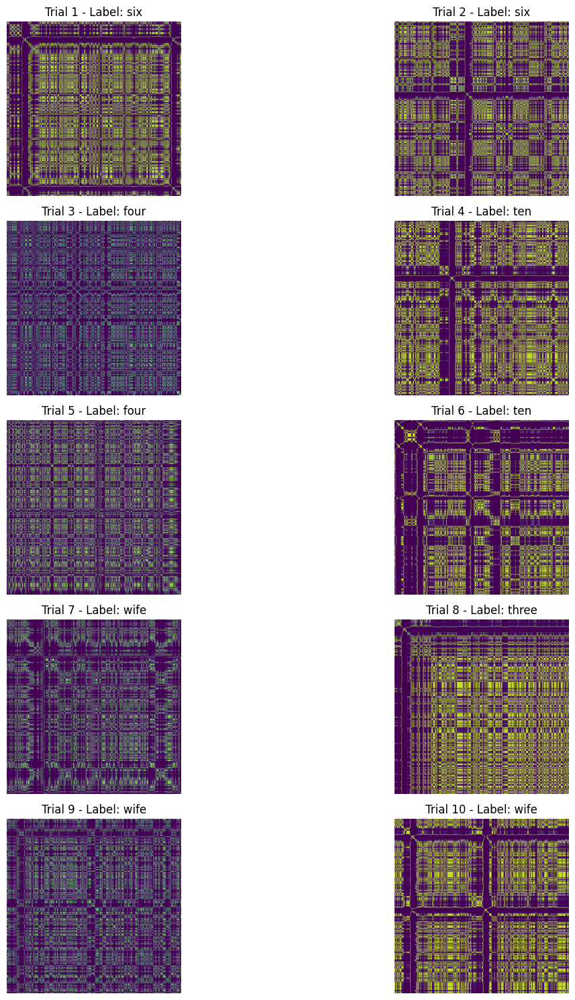

In [51]:
import matplotlib.pyplot as plt

def visualize_mtf_images_with_labels(mtf_images, labels, num_trials=10):
    """
    Visualize MTF images for the first channel of the given number of trials with their labels.

    Args:
    - mtf_images (numpy array): MTF-transformed signals with shape 
      (trials, channels, image_height, image_width).
    - labels (numpy array): Labels corresponding to the trials.
    - num_trials (int): Number of trials to visualize.
    """
    # Determine the number of rows and columns for the grid
    num_rows = num_trials // 2 + num_trials % 2  # Two columns per row
    num_cols = 2

    plt.figure(figsize=(15, 3 * num_rows))
    for i in range(num_trials):
        plt.subplot(num_rows, num_cols, i + 1)
        trial_idx = i
        channel_idx = 0  # Visualize the first channel for each trial
        plt.imshow(mtf_images[trial_idx, channel_idx], cmap='viridis')
        plt.title(f"Trial {trial_idx + 1} - Label: {labels[trial_idx]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the first 10 trials' MTF images along with their labels
visualize_mtf_images_with_labels(mtf_images, labels_eeg, num_trials=10)


In [58]:
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf

# Ensure label_classes match `label_order`
label_order = ['three', 'four', 'six', 'ten', 'child', 'daughter', 'wife', 'father']
label_to_numeric = {label: index for index, label in enumerate(label_order)}
numeric_labels = np.array([label_to_numeric[label] for label in labels_eeg])  # Convert string labels to numeric

# Normalize the MTF images
normalized_mtf_images = mtf_images / np.max(mtf_images)
print(f"Normalized MTF Images Shape: {normalized_mtf_images.shape}")

# Add channel dimension for CNN input
cnn_input = np.expand_dims(normalized_mtf_images, axis=-1)  # Shape: (samples, channels, height, width, 1)
print(f"Corrected cnn_input shape: {cnn_input.shape}")

# Resize each trial’s MTF images to a fixed size (e.g., (256, 256))
# Flatten channels into batch dimension for resizing
reshaped_images = cnn_input.reshape(-1, cnn_input.shape[2], cnn_input.shape[3], cnn_input.shape[4])
resized_images = np.array([
    tf.image.resize(image, [256, 256]).numpy() for image in reshaped_images
])

# Reshape back to original shape (samples, channels, height, width, 1)
resized_images = resized_images.reshape(cnn_input.shape[0], cnn_input.shape[1], 256, 256, 1)
print(f"Resized Images Shape: {resized_images.shape}")

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    resized_images, numeric_labels, test_size=0.2, random_state=42
)

# Convert labels to one-hot encoding for the CNN
y_train = tf.keras.utils.to_categorical(y_train, num_classes=len(label_order))
y_test = tf.keras.utils.to_categorical(y_test, num_classes=len(label_order))

# Define the CNN model
model2 = tf.keras.Sequential([
    tf.keras.layers.Conv3D(32, (3, 3, 3), activation='relu', input_shape=(48, 256, 256, 1)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling3D((2, 2, 2)),
    
    tf.keras.layers.Conv3D(64, (3, 3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling3D((2, 2, 2)),
    tf.keras.layers.Dropout(0.5),
    
    tf.keras.layers.Conv3D(128, (3, 3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling3D((2, 2, 2)),
    tf.keras.layers.Dropout(0.5),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(len(label_order), activation='softmax')
])

# Compile the model
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the CNN
history2 = model2.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=20,
    batch_size=32
)

# Evaluate the model
eval_results = model2.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {eval_results[0]:.4f}")
print(f"Test Accuracy: {eval_results[1]:.4f}")


Normalized MTF Images Shape: (10, 48, 2048, 2048)
Corrected cnn_input shape: (10, 48, 2048, 2048, 1)
Resized Images Shape: (10, 48, 256, 256, 1)
Epoch 1/20


NotFoundError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "/usr/local/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/local/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/site-packages/ipykernel_launcher.py", line 18, in <module>

  File "/usr/local/lib/python3.10/site-packages/traitlets/config/application.py", line 1075, in launch_instance

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 737, in start

  File "/usr/local/lib/python3.10/site-packages/anyio/_core/_eventloop.py", line 74, in run

  File "/usr/local/lib/python3.10/site-packages/anyio/_backends/_asyncio.py", line 2303, in run

  File "/usr/local/lib/python3.10/site-packages/anyio/_backends/_asyncio.py", line 216, in run

  File "/usr/local/lib/python3.10/asyncio/base_events.py", line 636, in run_until_complete

  File "/usr/local/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/local/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/local/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 428, in process_shell

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 501, in process_shell_message

  File "/usr/local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 337, in execute_request

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 752, in execute_request

  File "/usr/local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 433, in do_execute

  File "/usr/local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 582, in run_cell

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3075, in run_cell

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3130, in _run_cell

  File "/usr/local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3334, in run_cell_async

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3517, in run_ast_nodes

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3577, in run_code

  File "/tmp/ipykernel_10/194868707.py", line 64, in <module>

  File "/usr/local/lib/python3.10/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

could not find registered transfer manager for platform Host -- check target linkage
	 [[{{node StatefulPartitionedCall}}]] [Op:__inference_multi_step_on_iterator_18111]

In [53]:
from sklearn.model_selection import train_test_split
import tensorflow as tf
import numpy as np

# Ensure label_classes match `label_order`
label_order = ['three', 'four', 'six', 'ten', 'child', 'daughter', 'wife', 'father']
label_to_numeric = {label: index for index, label in enumerate(label_order)}
numeric_labels = np.array([label_to_numeric[label] for label in labels_eeg])  # Convert string labels to numeric

# Normalize the MTF images
normalized_mtf_images = mtf_images / np.max(mtf_images)

# Expand dimensions for the CNN input
cnn_input = np.expand_dims(normalized_mtf_images, axis=-1)

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    cnn_input, numeric_labels, test_size=0.2, random_state=42
)

# Convert labels to one-hot encoding for the CNN
y_train = tf.keras.utils.to_categorical(y_train, num_classes=len(label_order))
y_test = tf.keras.utils.to_categorical(y_test, num_classes=len(label_order))

# Define the CNN model
model2 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2], X_train.shape[3])),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(len(label_order), activation='softmax')
])

# Compile the model
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the CNN
history2 = model2.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=20,
    batch_size=2
)

# Evaluate the model
eval_results = model2.evaluate(X_test, y_test, verbose=0)
print(f"Test Loss: {eval_results[0]:.4f}")
print(f"Test Accuracy: {eval_results[1]:.4f}")


Epoch 1/20


NotFoundError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "/usr/local/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/local/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/site-packages/ipykernel_launcher.py", line 18, in <module>

  File "/usr/local/lib/python3.10/site-packages/traitlets/config/application.py", line 1075, in launch_instance

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 737, in start

  File "/usr/local/lib/python3.10/site-packages/anyio/_core/_eventloop.py", line 74, in run

  File "/usr/local/lib/python3.10/site-packages/anyio/_backends/_asyncio.py", line 2303, in run

  File "/usr/local/lib/python3.10/site-packages/anyio/_backends/_asyncio.py", line 216, in run

  File "/usr/local/lib/python3.10/asyncio/base_events.py", line 636, in run_until_complete

  File "/usr/local/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/local/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/local/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 428, in process_shell

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 501, in process_shell_message

  File "/usr/local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 337, in execute_request

  File "/usr/local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 752, in execute_request

  File "/usr/local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 433, in do_execute

  File "/usr/local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 582, in run_cell

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3075, in run_cell

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3130, in _run_cell

  File "/usr/local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3334, in run_cell_async

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3517, in run_ast_nodes

  File "/usr/local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3577, in run_code

  File "/tmp/ipykernel_10/2117307799.py", line 36, in <module>

  File "/usr/local/lib/python3.10/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

could not find registered transfer manager for platform Host -- check target linkage
	 [[{{node StatefulPartitionedCall}}]] [Op:__inference_multi_step_on_iterator_8510]